# DETAILS OF FEATURE EXPLORATION AND LOGISTIC REGRESSION

In [95]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline 
# the line above helps rendering plots

import matplotlib as mpl
import seaborn as sns # a fancy plotting package
mpl.rcParams['figure.dpi'] = 400 # high resolution figures


In [96]:
df = pd.read_csv('data/Chapter_1_cleaned_data.csv')
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,...,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month,EDUCATION_CAT,graduate_school,high_school,others,university
0,798fc410-45c1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,0,1,university,0,0,0,1
1,8a8c8f3b-8eb4,120000,2,2,2,26,-1,2,0,0,...,1000,1000,0,2000,1,university,0,0,0,1
2,85698822-43f5,90000,2,2,2,34,0,0,0,0,...,1000,1000,1000,5000,0,university,0,0,0,1
3,0737c11b-be42,50000,2,2,1,37,0,0,0,0,...,1200,1100,1069,1000,0,university,0,0,0,1
4,3b7f77cc-dbc0,50000,1,2,1,57,-1,0,-1,0,...,10000,9000,689,679,0,university,0,0,0,1


In [97]:
features_response = df.columns.to_list()
features_response

['ID',
 'LIMIT_BAL',
 'SEX',
 'EDUCATION',
 'MARRIAGE',
 'AGE',
 'PAY_1',
 'PAY_2',
 'PAY_3',
 'PAY_4',
 'PAY_5',
 'PAY_6',
 'BILL_AMT1',
 'BILL_AMT2',
 'BILL_AMT3',
 'BILL_AMT4',
 'BILL_AMT5',
 'BILL_AMT6',
 'PAY_AMT1',
 'PAY_AMT2',
 'PAY_AMT3',
 'PAY_AMT4',
 'PAY_AMT5',
 'PAY_AMT6',
 'default payment next month',
 'EDUCATION_CAT',
 'graduate_school',
 'high_school',
 'others',
 'university']

In [98]:
items_to_remove = ['PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', \
                   'EDUCATION_CAT', 'graduate_school', 'high_school', 'others', 'university',\
                    'SEX', 'ID']

features_response = [item for item in features_response if item not in items_to_remove]
features_response

['LIMIT_BAL',
 'EDUCATION',
 'MARRIAGE',
 'AGE',
 'PAY_1',
 'BILL_AMT1',
 'BILL_AMT2',
 'BILL_AMT3',
 'BILL_AMT4',
 'BILL_AMT5',
 'BILL_AMT6',
 'PAY_AMT1',
 'PAY_AMT2',
 'PAY_AMT3',
 'PAY_AMT4',
 'PAY_AMT5',
 'PAY_AMT6',
 'default payment next month']

In [99]:
df_corr = df[features_response].corr()
df_corr

,LIMIT_BAL,EDUCATION,MARRIAGE,AGE,PAY_1,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
LIMIT_BAL,1.000000,-0.232688,-0.111873,0.149157,-0.273396,0.287009,0.279289,0.285299,0.294342,0.295198,0.289818,0.194820,0.188049,0.207638,0.202795,0.218082,0.221305,-0.154423
EDUCATION,-0.232688,1.000000,-0.137097,0.179035,0.112653,0.016156,0.012307,0.007683,-0.005862,-0.013174,-0.012670,-0.040092,-0.033610,-0.042349,-0.039319,-0.044946,-0.046859,0.034966
MARRIAGE,-0.111873,-0.137097,1.000000,-0.412828,0.019759,-0.028610,-0.026009,-0.029192,-0.027740,-0.029895,-0.024414,-0.002951,-0.007548,-0.003408,-0.014387,-0.000410,-0.009461,-0.026030
AGE,0.149157,0.179035,-0.412828,1.000000,-0.044277,0.056245,0.054099,0.054107,0.051241,0.049701,0.047519,0.025437,0.025421,0.029876,0.025307,0.020541,0.021640,0.014334
PAY_1,-0.273396,0.112653,0.019759,-0.044277,1.000000,0.185826,0.188799,0.181257,0.178812,0.180438,0.177486,-0.081450,-0.073295,-0.072682,-0.064112,-0.057021,-0.061031,0.325365
BILL_AMT1,0.287009,0.016156,-0.028610,0.056245,0.185826,1.000000,0.951651,0.900386,0.860149,0.828615,0.802008,0.138221,0.112460,0.145635,0.160204,0.163425,0.178943,-0.020508
BILL_AMT2,0.279289,0.012307,-0.026009,0.054099,0.188799,0.951651,1.000000,0.937488,0.892103,0.858078,0.830300,0.276583,0.114473,0.137514,0.148685,0.153851,0.172472,-0.014579
BILL_AMT3,0.285299,0.007683,-0.029192,0.054107,0.181257,0.900386,0.937488,1.000000,0.930385,0.889186,0.855154,0.242809,0.287837,0.119456,0.141010,0.159446,0.178121,-0.014649
BILL_AMT4,0.294342,-0.005862,-0.027740,0.051241,0.178812,0.860149,0.892103,0.930385,1.000000,0.937799,0.899241,0.229123,0.217716,0.293652,0.131700,0.158633,0.171339,-0.011349
BILL_AMT5,0.295198,-0.013174,-0.029895,0.049701,0.180438,0.828615,0.858078,0.889186,0.937799,1.000000,0.945671,0.212053,0.189566,0.241291,0.296192,0.140669,0.161847,-0.006753


<AxesSubplot:>

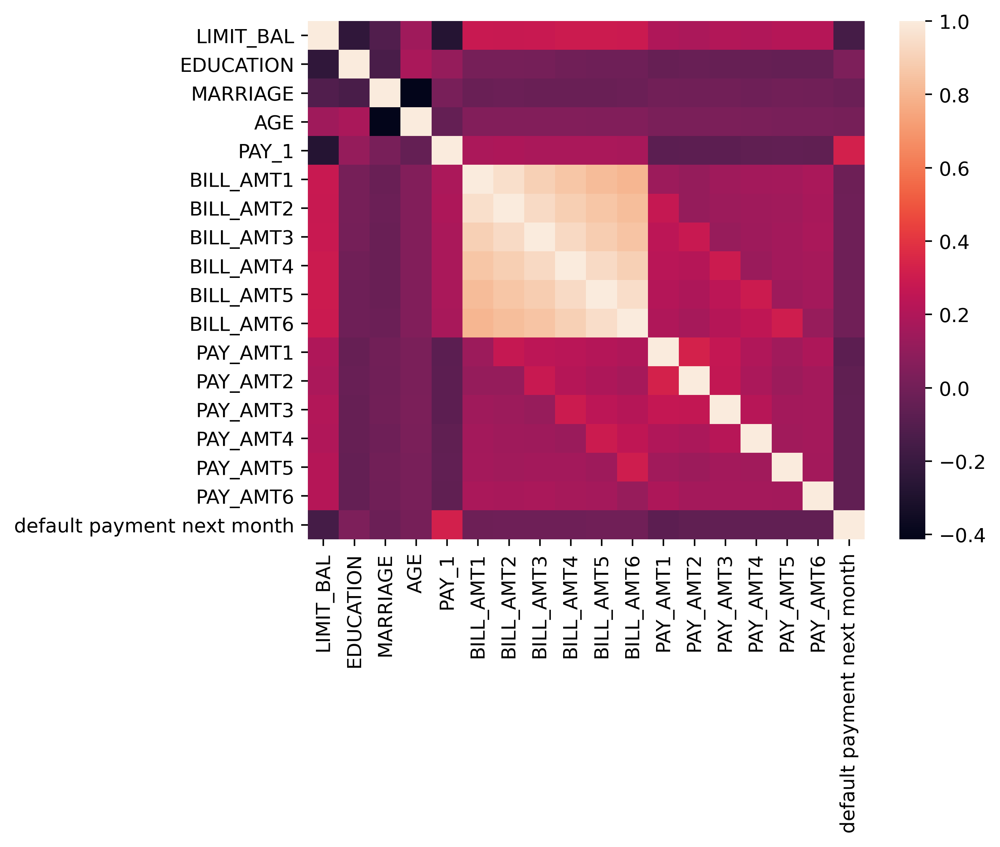

In [100]:
sns.heatmap(df_corr, xticklabels=df_corr.columns.values, yticklabels=df_corr.columns.values)
# center=0 implies that positive ad negative correlation are distinguishable as red and blue

In [101]:
features_response

['LIMIT_BAL',
 'EDUCATION',
 'MARRIAGE',
 'AGE',
 'PAY_1',
 'BILL_AMT1',
 'BILL_AMT2',
 'BILL_AMT3',
 'BILL_AMT4',
 'BILL_AMT5',
 'BILL_AMT6',
 'PAY_AMT1',
 'PAY_AMT2',
 'PAY_AMT3',
 'PAY_AMT4',
 'PAY_AMT5',
 'PAY_AMT6',
 'default payment next month']

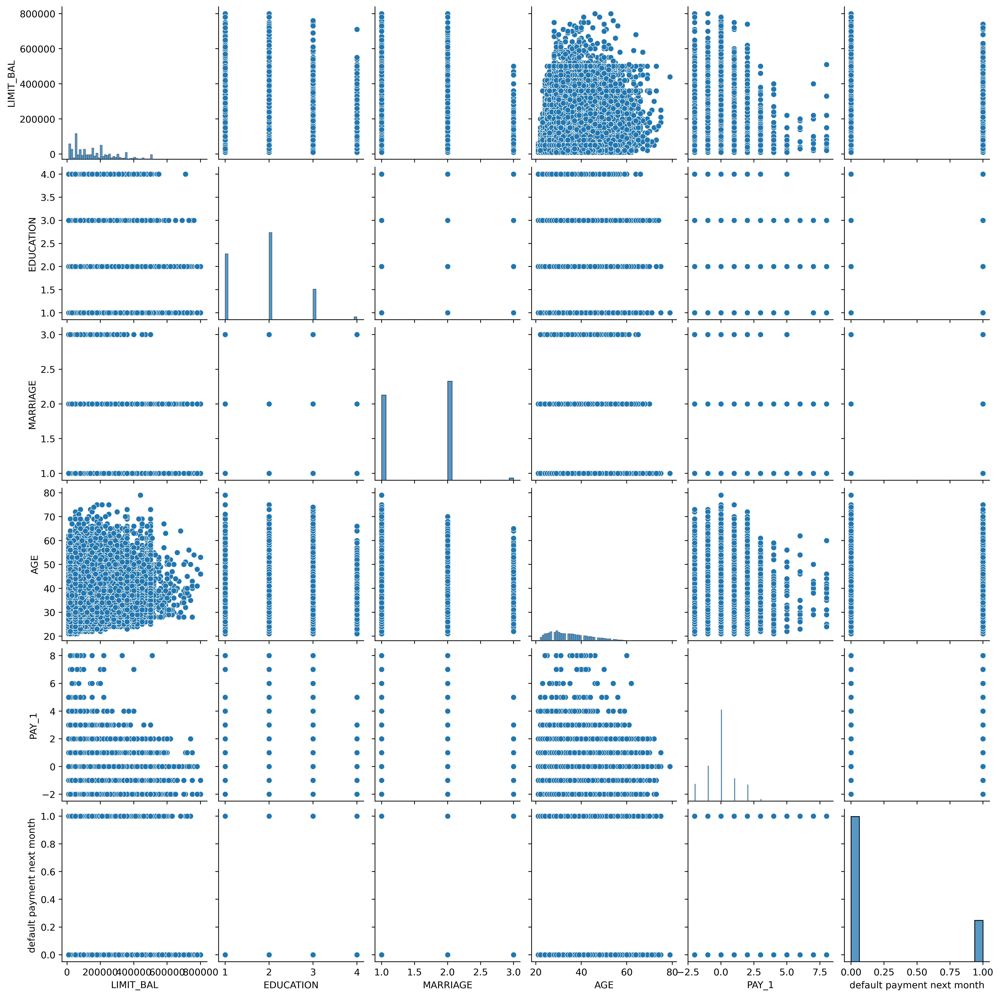

In [102]:
subls_features_response1 = [elem for sublist in [features_response[:5], [features_response[-1]]] for elem in sublist]
df_features_response = df[subls_features_response1].copy()
sns.pairplot(df_features_response)

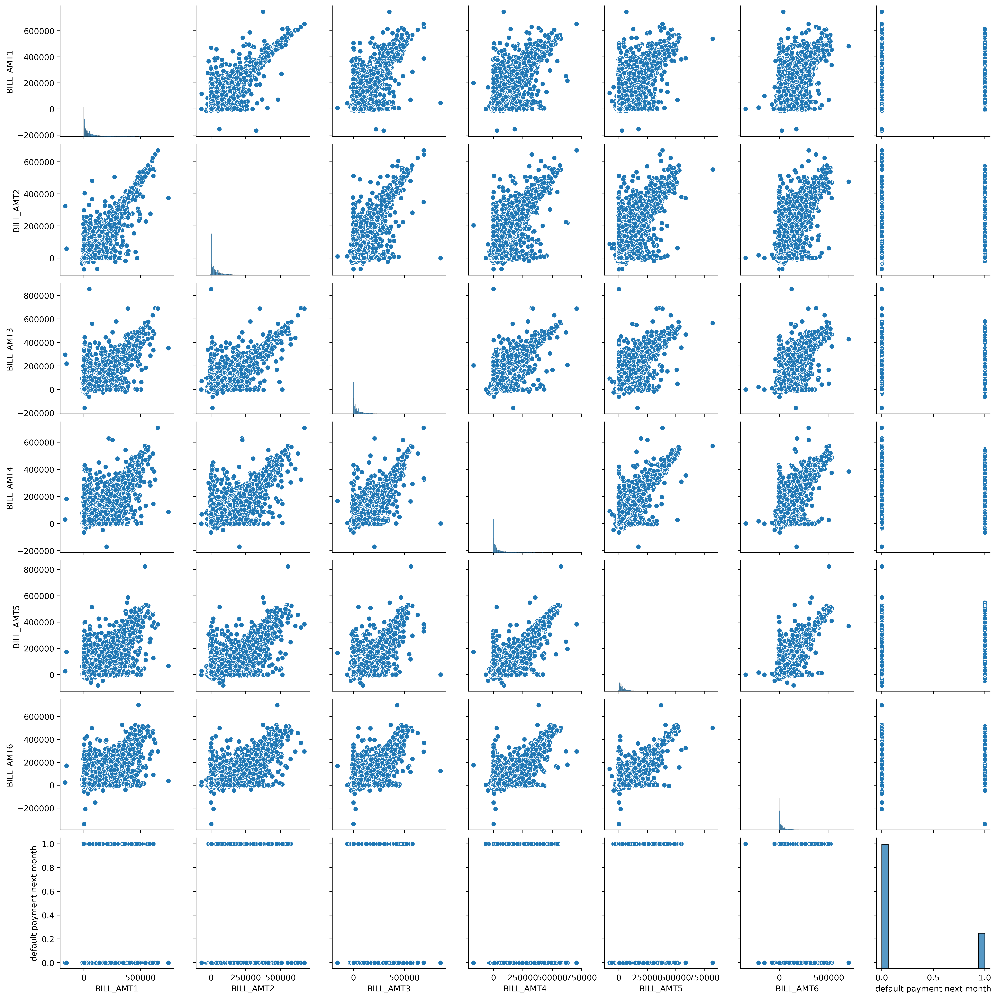

In [103]:
subls_features_response2 = [elem for sublist in [features_response[5:11], [features_response[-1]]] for elem in sublist]
df_features_response2 = df[subls_features_response2].copy()
sns.pairplot(df_features_response2)

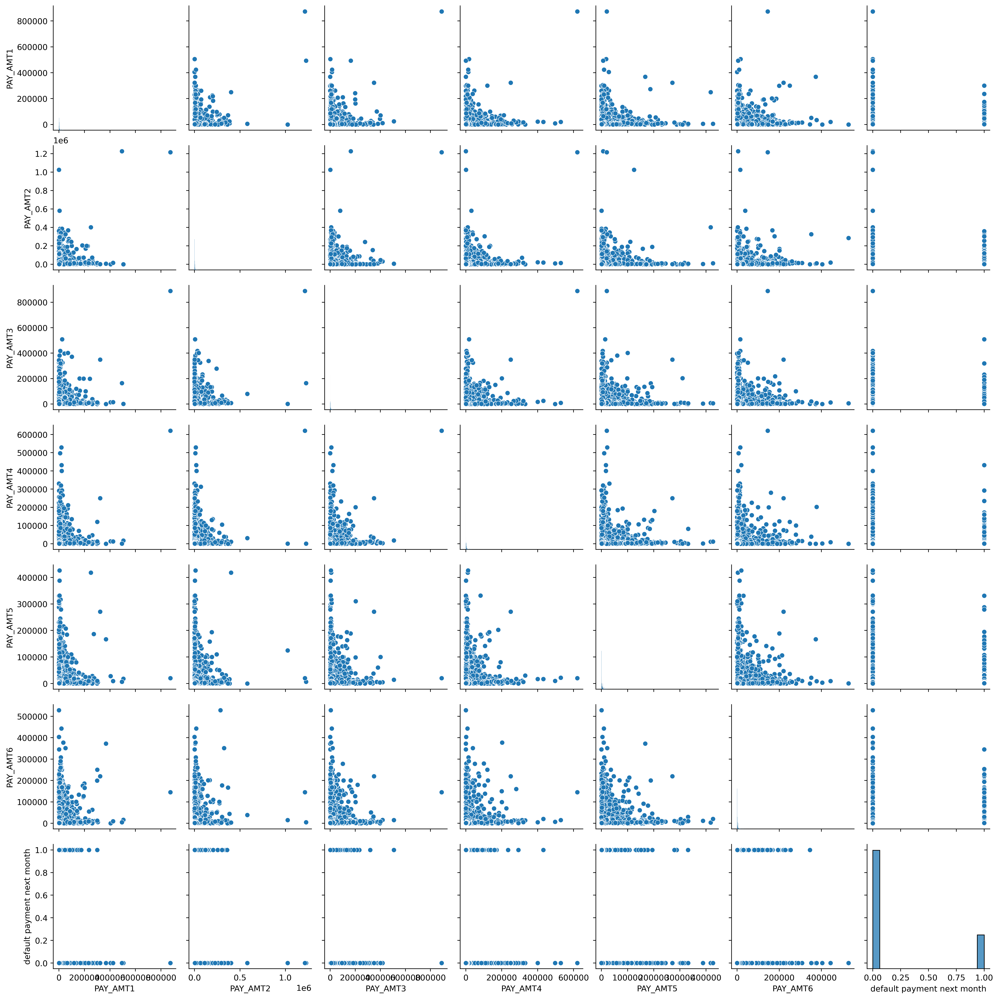

In [104]:
subls_features_response3 = [elem for sublist in [features_response[11:17], [features_response[-1]]] for elem in sublist]
df_features_response3 = df[subls_features_response3].copy()
sns.pairplot(df_features_response3)

### F-test and univariate feature selection

In [105]:
features_response

['LIMIT_BAL',
 'EDUCATION',
 'MARRIAGE',
 'AGE',
 'PAY_1',
 'BILL_AMT1',
 'BILL_AMT2',
 'BILL_AMT3',
 'BILL_AMT4',
 'BILL_AMT5',
 'BILL_AMT6',
 'PAY_AMT1',
 'PAY_AMT2',
 'PAY_AMT3',
 'PAY_AMT4',
 'PAY_AMT5',
 'PAY_AMT6',
 'default payment next month']

In [106]:
X = df[features_response[:-1]].values
y = df[features_response[-1]].values

In [107]:
print(X.shape, y.shape)

(26664, 17) (26664,)


In [108]:
from sklearn import feature_selection

[f_stat, f_p_value] = feature_selection.f_classif(X, y)
# f_stat is the F-statistic
# f_p_value is the p-value

In [109]:
print(f_stat.shape, f_p_value.shape)

(17,) (17,)


In [110]:
f_test_df = pd.DataFrame(data={'Feature': features_response[:-1], 'F-test': f_stat,'P-value': f_p_value})
f_test_df.sort_values('P-value')

,Feature,F-test,P-value
4,PAY_1,3156.672300,0.000000e+00
0,LIMIT_BAL,651.324071,5.838366e-142
11,PAY_AMT1,140.612679,2.358354e-32
12,PAY_AMT2,101.408321,8.256124e-24
13,PAY_AMT3,90.023873,2.542641e-21
15,PAY_AMT5,85.843295,2.090120e-20
16,PAY_AMT6,80.420784,3.219565e-19
14,PAY_AMT4,79.640021,4.774112e-19
1,EDUCATION,32.637768,1.122175e-08
2,MARRIAGE,18.078027,2.127555e-05


In [111]:
selector = feature_selection.SelectPercentile(feature_selection.f_classif, percentile = 20)

In [112]:
selector.fit(X,y)

SelectPercentile(percentile=20)

In [113]:
best_feature_ix = selector.get_support()
best_feature_ix

array([ True, False, False, False,  True, False, False, False, False,
       False, False,  True,  True, False, False, False, False])

In [114]:
features = features_response[:-1]
selected_features = [feat for index, feat in enumerate(features) if best_feature_ix[index]]
selected_features

['LIMIT_BAL', 'PAY_1', 'PAY_AMT1', 'PAY_AMT2']

### EXERCISE 3.02: VISUALIZING THE RELATIONSHIP BETWEEN THE FEATURES AND RESPONSE VARIABLE

In [115]:
overall_default_rate = df['default payment next month'].mean()
overall_default_rate

0.2217971797179718

Let us visualize default rates for different values of 'PAY_1':

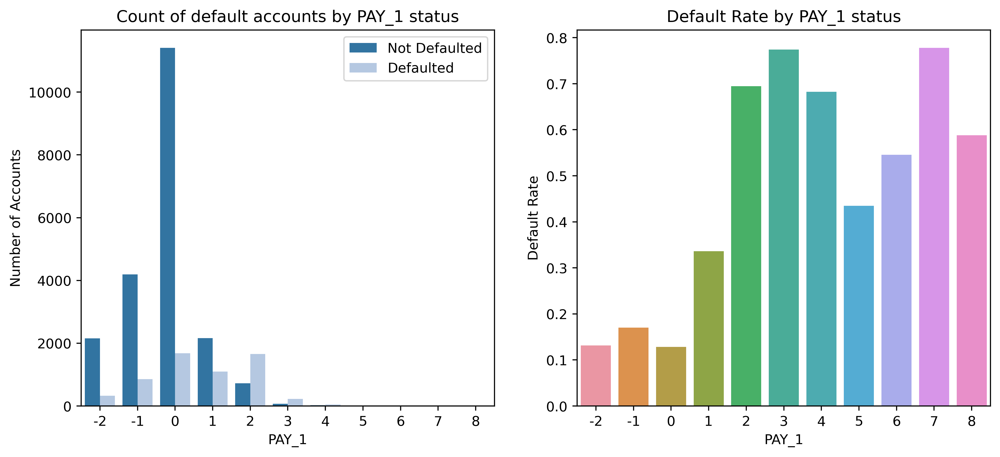

In [116]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (12, 5))

sns.countplot(x = 'PAY_1', hue = 'default payment next month', data = df,  palette = 'tab20', ax = ax1) 
ax1.legend(['Not Defaulted', 'Defaulted'])
ax1.set_title('Count of default accounts by PAY_1 status')
ax1.set_ylabel('Number of Accounts')

sns.barplot(x = 'PAY_1', y = 'default payment next month', data = df, ci = None, ax = ax2)
ax2.set_title('Default Rate by PAY_1 status')
ax2.set_ylabel('Default Rate');

We can decode the chart on the right as a table as follows:

In [117]:
df.groupby('PAY_1')['default payment next month'].mean().to_frame()

,default payment next month
PAY_1,
-2,0.131664
-1,0.170002
0,0.128295
1,0.336400
2,0.694701
3,0.773973
4,0.682540
5,0.434783
6,0.545455


Another way to do it:

In [118]:
df.groupby('PAY_1').agg({'default payment next month':np.mean})

,default payment next month
PAY_1,
-2,0.131664
-1,0.170002
0,0.128295
1,0.336400
2,0.694701
3,0.773973
4,0.682540
5,0.434783
6,0.545455


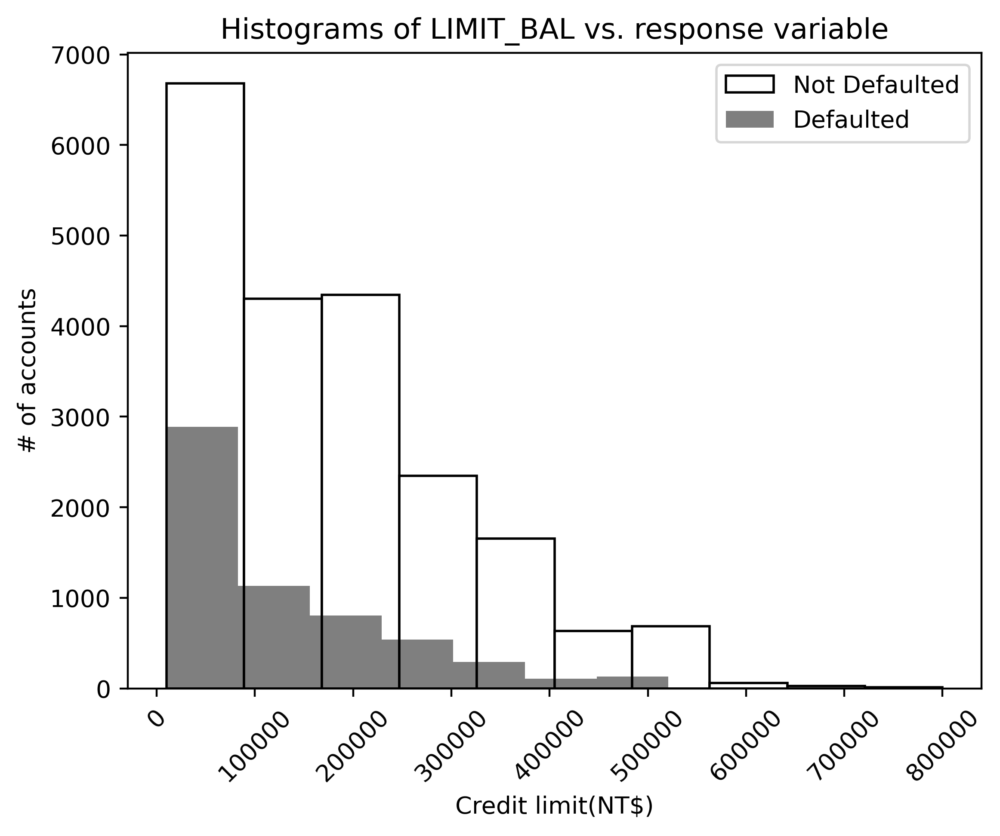

In [119]:
axis = plt.axes()
axis.hist(df[df['default payment next month'] == 0]['LIMIT_BAL'], edgecolor='black', color='white', label = 'Not Defaulted')
axis.hist(df[df['default payment next month'] == 1]['LIMIT_BAL'], edgecolor=None, color='black', alpha=0.5, label = 'Defaulted')
axis.legend()
axis.tick_params(axis='x', labelrotation=45)
axis.set_xlabel('Credit limit(NT$)')
axis.set_ylabel('# of accounts')
axis.set_title('Histograms of LIMIT_BAL vs. response variable')
plt.show()

Almost similar alternative using seaborn `displot()`:

In [120]:
# sns.displot(data=df, x='LIMIT_BAL', hue='default payment next month' , bins=10)
# plt.tight_layout()

Let us produce a **normalized** histogram:

In [121]:
bin_edges = list(range(0, 850000, 50000))
print(bin_edges)

[0, 50000, 100000, 150000, 200000, 250000, 300000, 350000, 400000, 450000, 500000, 550000, 600000, 650000, 700000, 750000, 800000]


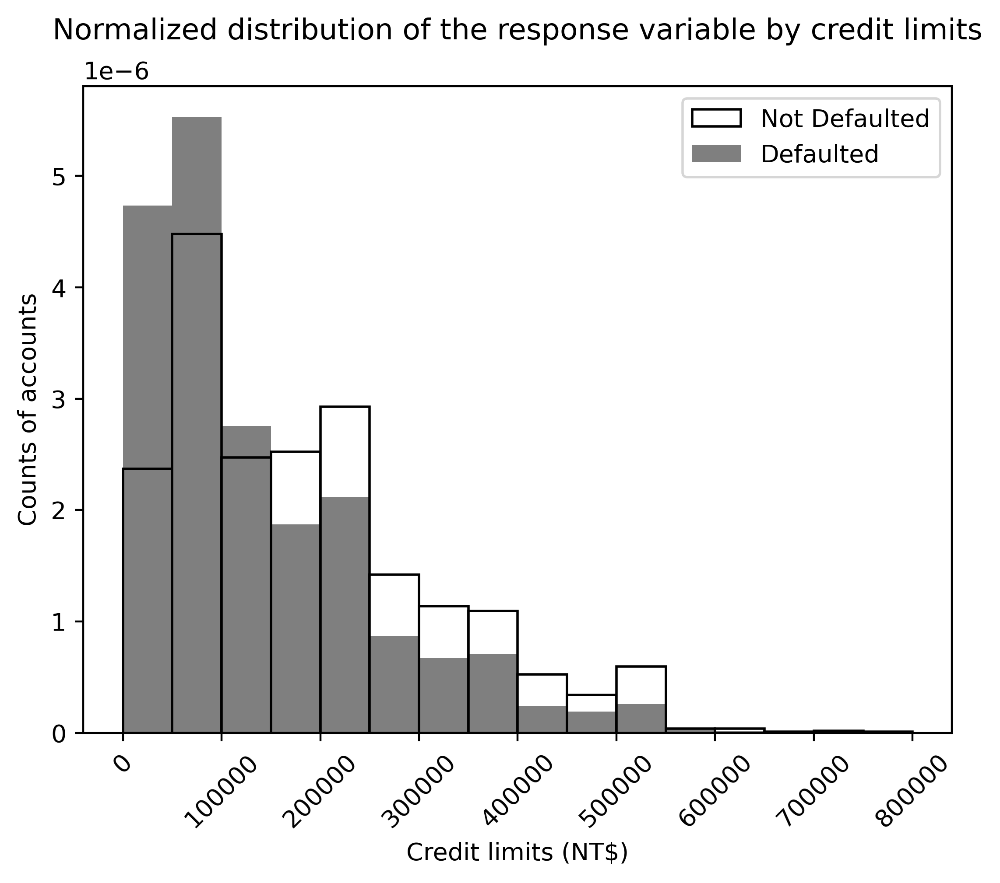

In [122]:
axes = plt.axes()
axes.hist(df[df['default payment next month'] == 0]['LIMIT_BAL'], bins=bin_edges, density=True, edgecolor='black', color='white', label='Not Defaulted')
axes.hist(df[df['default payment next month'] == 1]['LIMIT_BAL'], bins=bin_edges, density=True, edgecolor=None, color='black', alpha=0.5, label='Defaulted')
y_ticks = axes.get_yticks()
axes.set_title('Normalized distribution of the response variable by credit limits\n')
axes.set_xlabel('Credit limits (NT$)')
axes.set_ylabel('Counts of accounts')
axes.tick_params(axis='x', labelrotation=45)
axes.legend()

We try to reproduce the y-axis ticks label calculation explained in the bok here:

In [123]:
y_ticks

array([0.e+00, 1.e-06, 2.e-06, 3.e-06, 4.e-06, 5.e-06, 6.e-06])

In [124]:
mask = (df['default payment next month']==1) & (df['LIMIT_BAL']<100000) & (df['LIMIT_BAL']>=50000)
count = df[mask].shape[0]
n_observations=df[df['default payment next month']==1].shape[0]

In [125]:
bin_height = count/(n_observations*50000) # bin heights are calculated by dividing the count by the # of observations times the bin width
bin_height

5.52925262089956e-06

In [126]:
bin_height*50000 # this is the height of the bin corresponding to bin [50.000, 100.000)] when proportions are calculated

0.27646263104497804

C:\Users\ElenaGutiérrezViedma\AppData\Local\Temp\ipykernel_18212\1645247884.py:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes.set_yticklabels(np.round(y_ticks*50000,2))


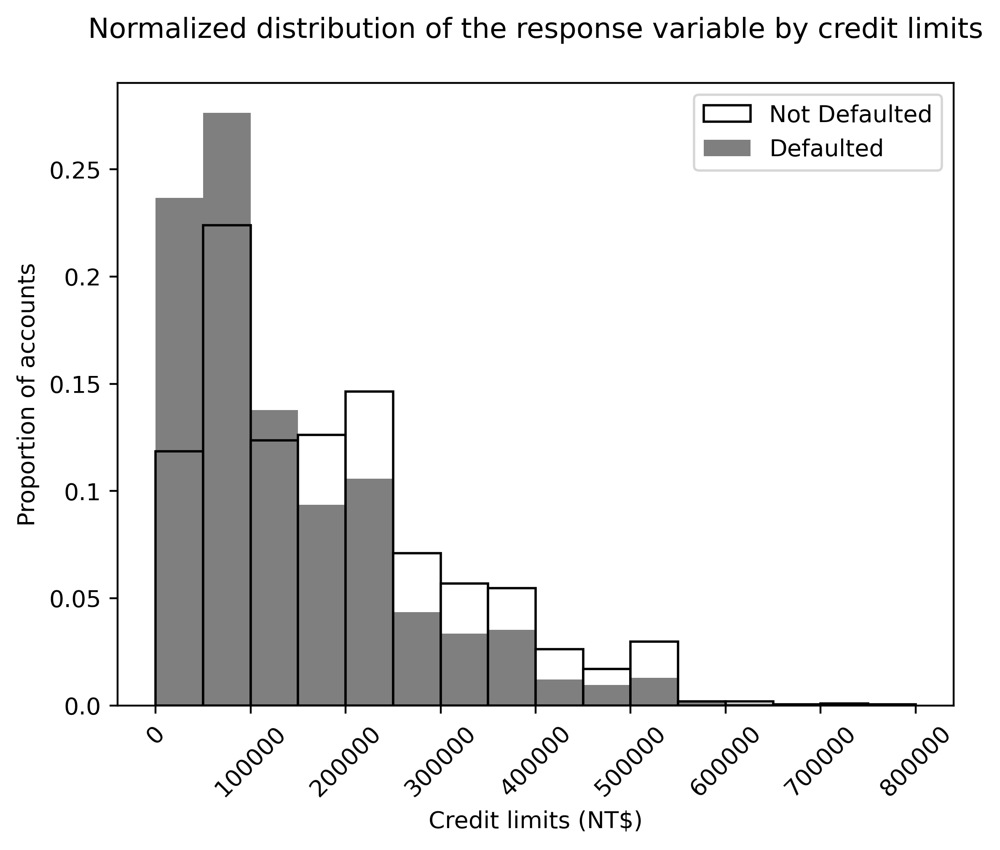

In [127]:
# Now, we calculate proportions for the Y-axis
axes = plt.axes()
axes.hist(df[df['default payment next month'] == 0]['LIMIT_BAL'], bins=bin_edges, density=True, edgecolor='black', color='white', label='Not Defaulted')
axes.hist(df[df['default payment next month'] == 1]['LIMIT_BAL'], bins=bin_edges, density=True, edgecolor=None, color='black', alpha=0.5, label='Defaulted')
axes.set_title('Normalized distribution of the response variable by credit limits\n')
axes.set_xlabel('Credit limits (NT$)')
axes.set_ylabel('Proportion of accounts')
y_ticks = axes.get_yticks()
axes.set_yticklabels(np.round(y_ticks*50000,2))
axes.tick_params(axis='x', labelrotation=45)
axes.legend()

### EXERCISE 3.03 PLOTTING THE SIGMOID FUNCTION

Text(0.5, 1.0, 'Plot of $e^x$')

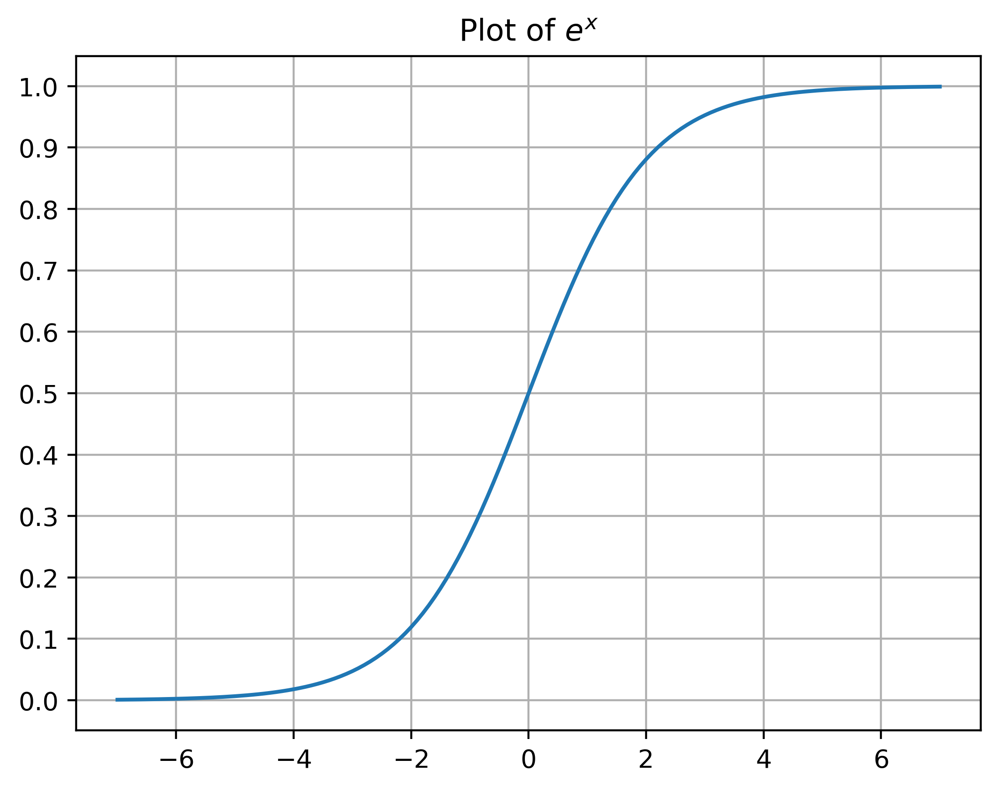

In [128]:
X_exp = np.linspace(-7, 7, 141)
Y_exp = 1/(1 + np.exp(-X_exp))
plt.plot(X_exp, Y_exp)
plt.yticks(np.linspace(0,1,11))
plt.grid()
plt.title('Plot of $e^x$')

C:\Users\ElenaGutiérrezViedma\AppData\Local\Temp\ipykernel_18212\3226638807.py:5: RuntimeWarning: divide by zero encountered in true_divide
  y = p/q


Text(0.5, 1.0, 'p vs. q')

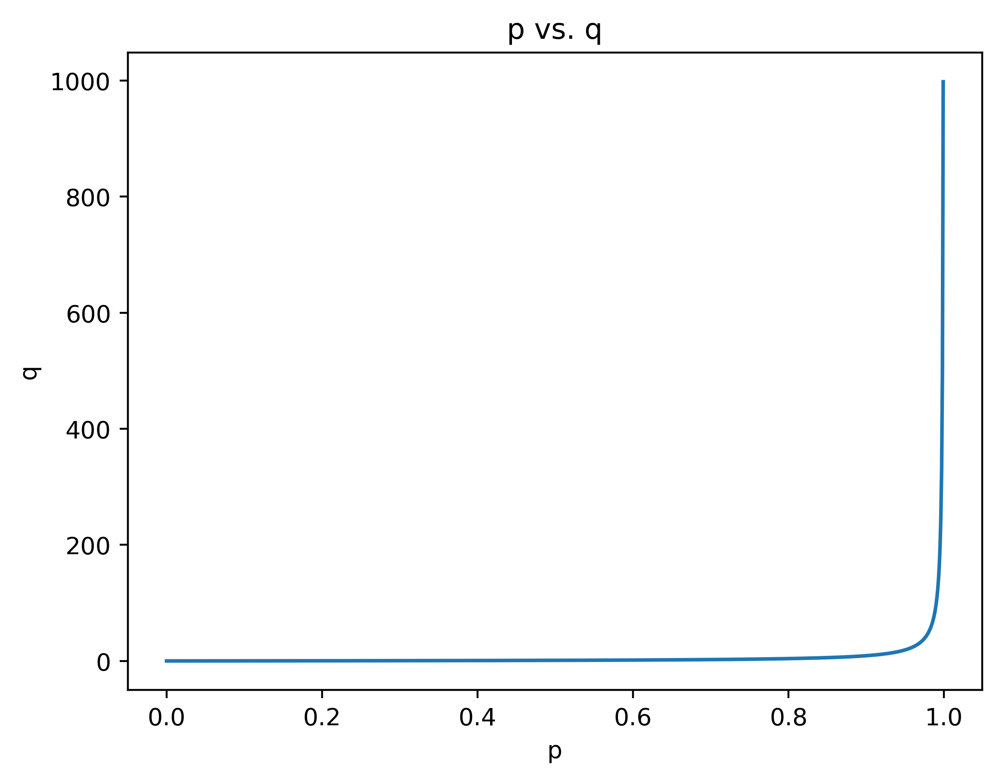

In [129]:
p = np.linspace(0, 1, 1000)
q = 1-p

axis = plt.axes()
y = p/q
plt.plot(p,y)
axis.set_xlabel('p')
axis.set_ylabel('q')
plt.title('p vs. q')

### EXERCISE 3.05: LINEAR DECISION BOUNDARY FOR LOGISTIC REGRESSION

In [130]:
from numpy.random import default_rng

rg = default_rng(4)

X_1_pos = rg.uniform(low=1, high=7, size=(200,1)) # recall [low, high)
X_2_pos = rg.uniform(low=1, high=7, size=(200,1))

X_1_neg = rg.uniform(low=3, high=10, size=(200,1))
X_2_neg = rg.uniform(low=3, high=10, size=(200,1))

In [131]:
X_1_pos.shape

(200, 1)

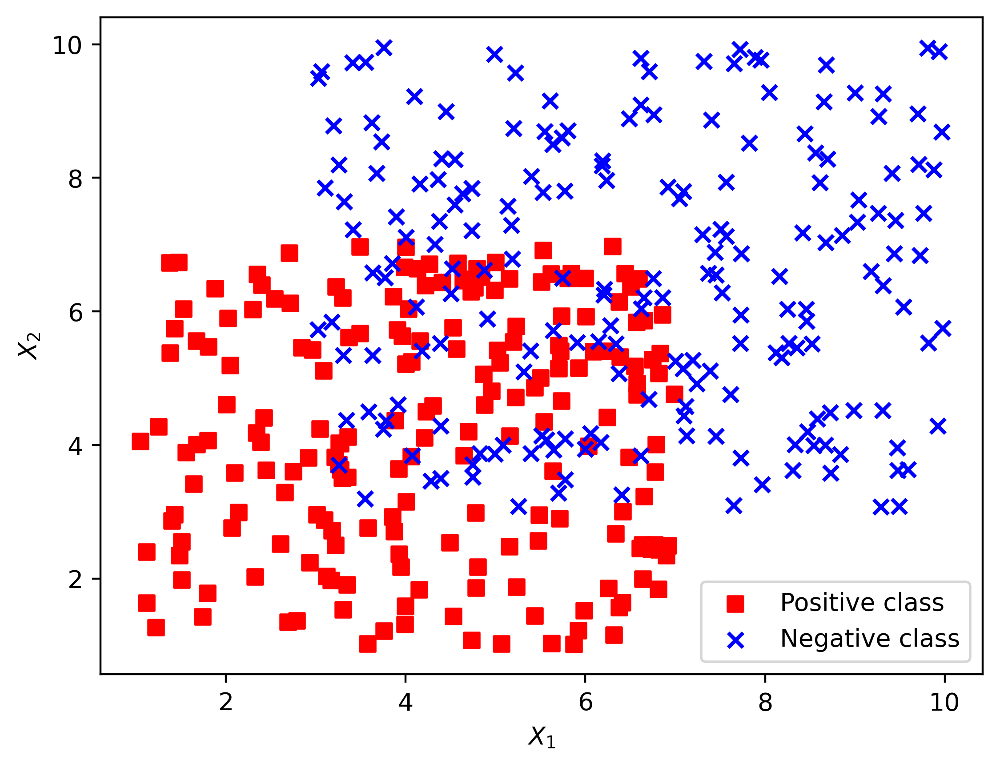

In [132]:
plt.scatter(X_1_pos, X_2_pos, color='red', marker='s')
plt.scatter(X_1_neg, X_2_neg, color='blue', marker='x')
plt.xlabel('$X_1$')
plt.ylabel('$X_2$')
plt.legend(['Positive class', 'Negative class'])

In [133]:
X = np.block([[X_1_pos, X_2_pos],[X_1_neg, X_2_neg]])
X.shape

(400, 2)

In [134]:
y = np.block([[np.ones((200,1))], [np.zeros((200,1))]]).reshape(400,)
y

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [135]:
from sklearn.linear_model import LogisticRegression

In [136]:
lr = LogisticRegression(solver='liblinear')

In [137]:
lr.fit(X, y)

LogisticRegression(solver='liblinear')

In [138]:
y_pred = lr.predict(X)

In [139]:
acc = (y_pred == y).sum()/(len(y))
acc

0.7725

In [140]:
(y_pred != y).sum()

91

In [141]:
false_neg_ix = [ix for ix, _ in enumerate(y_pred) if (y_pred[ix] != y[ix] and y [ix]== 1)]
false_pos_ix = [ix for ix, _ in enumerate(y_pred) if (y_pred[ix] != y[ix] and y[ix] == 0)]
len(false_neg_ix) + len(false_pos_ix)

91

The following scatterplot shows false negatives and false positives with a square surrounding the filled square and a circle surroinding the filled circle, respectively. One can observe that the problematic points (wrong predictions) are close to the linear decision boundary.

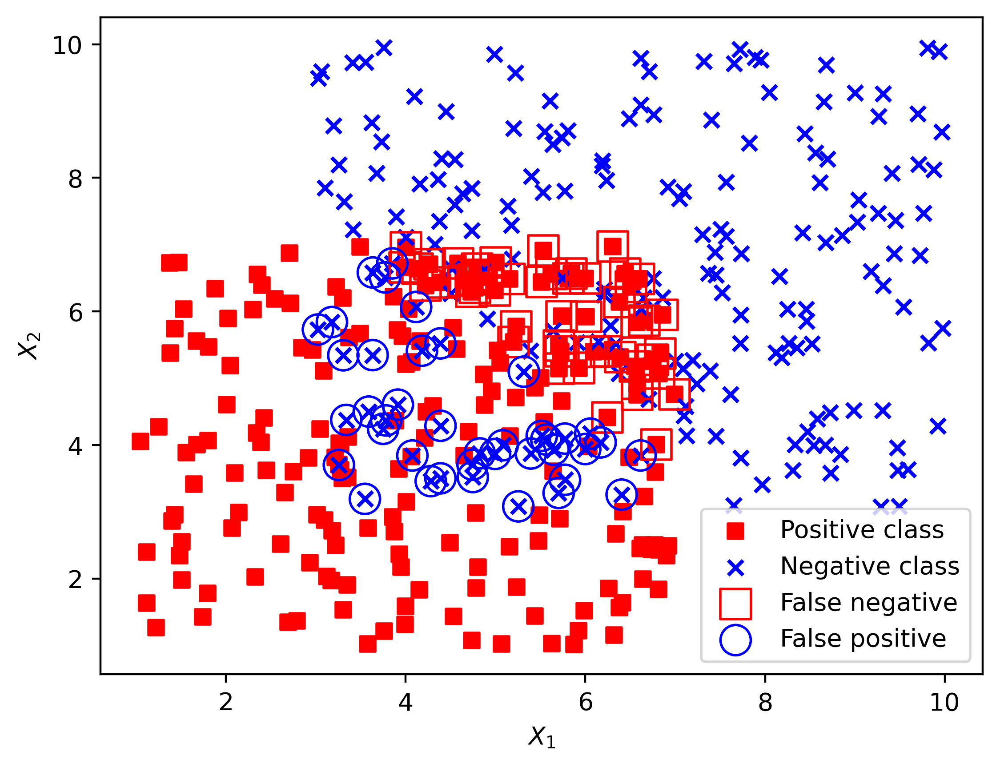

In [142]:
plt.scatter(X_1_pos, X_2_pos, color='red', marker='s')
plt.scatter(X_1_neg, X_2_neg, color='blue', marker='x')

plt.scatter(X[false_neg_ix, 0], X[false_neg_ix, 1], marker='s', s=150, edgecolors='red', facecolors='none')
plt.scatter(X[false_pos_ix, 0], X[false_pos_ix, 1], marker='o', s=150, edgecolors='blue', facecolors='none')
plt.xlabel('$X_1$')
plt.ylabel('$X_2$')
plt.legend(['Positive class', 'Negative class', 'False negative', 'False positive'])

In [143]:
print('Theta 1', lr.coef_[0][0])
print('Theta 2', lr.coef_[0][1])
print('Theta 0', lr.intercept_)

Theta 1 -0.4812627423125964
Theta 2 -0.46656510209741203
Theta 0 [4.99698621]


In [144]:
theta_0 = lr.intercept_
theta_1 = lr.coef_[0][0]
theta_2 = lr.coef_[0][1]

In [145]:
X_1_decision_boundary = np.array([0,10])
X_2_decision_boundary = -(theta_1/theta_2) * X_1_decision_boundary - (theta_0/theta_2)
X_2_decision_boundary

array([10.71015854,  0.39514054])

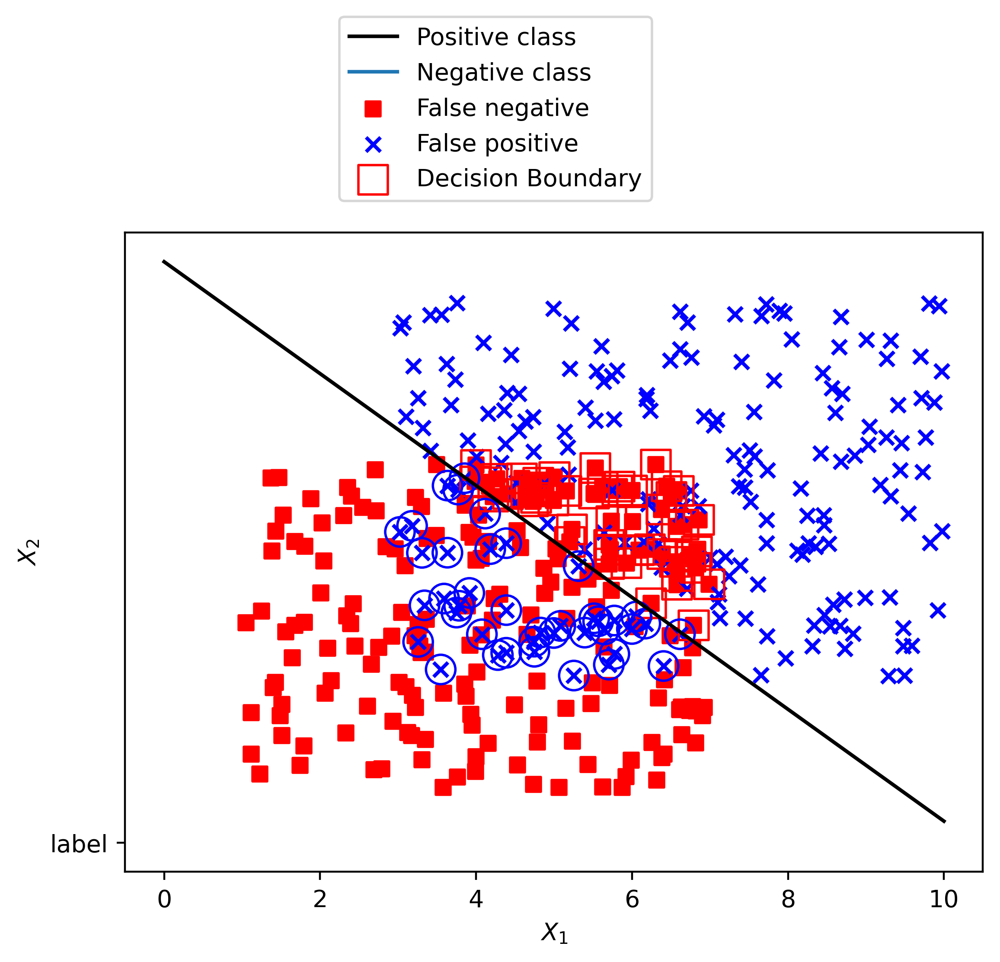

In [146]:
plt.scatter(X_1_pos, X_2_pos, color='red', marker='s')
plt.scatter(X_1_neg, X_2_neg, color='blue', marker='x')

plt.scatter(X[false_neg_ix, 0], X[false_neg_ix, 1], marker='s', s=150, edgecolors='red', facecolors='none')
plt.scatter(X[false_pos_ix, 0], X[false_pos_ix, 1], marker='o', s=150, edgecolors='blue', facecolors='none')

plt.plot(X_1_decision_boundary, X_2_decision_boundary, 'k-', 'label')
plt.xlabel('$X_1$')
plt.ylabel('$X_2$')
plt.legend(['Positive class', 'Negative class', 'False negative', 'False positive', 'Decision Boundary'], loc=[0.25, 1.05]) # loc=coordinates of the lower-left corner of the legend

### ACTIVITY 3.01: FITTING A LOGISTIC REGRESSION MODEL AND DIRECTLY USING COEFFICIENTS

In [147]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,...,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month,EDUCATION_CAT,graduate_school,high_school,others,university
0,798fc410-45c1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,0,1,university,0,0,0,1
1,8a8c8f3b-8eb4,120000,2,2,2,26,-1,2,0,0,...,1000,1000,0,2000,1,university,0,0,0,1
2,85698822-43f5,90000,2,2,2,34,0,0,0,0,...,1000,1000,1000,5000,0,university,0,0,0,1
3,0737c11b-be42,50000,2,2,1,37,0,0,0,0,...,1200,1100,1069,1000,0,university,0,0,0,1
4,3b7f77cc-dbc0,50000,1,2,1,57,-1,0,-1,0,...,10000,9000,689,679,0,university,0,0,0,1


In [149]:
X = df[['LIMIT_BAL', 'PAY_1']].values # X is Nx2 (X_1, X_2) where X_1 is LIMIT_BAL and X_2 is PAY_1
y = df['default payment next month'].values

In [154]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=42)


In [156]:
X_train.shape

(21331, 2)

In [157]:
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression(solver='liblinear')
lr

LogisticRegression(solver='liblinear')

In [158]:
lr.fit(X_train, y_train)

LogisticRegression(solver='liblinear')

In [159]:
y_preds = lr.predict(X_test)
y_preds

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [161]:
prob_preds = lr.predict_proba(X_test) # Recall that 1st and 2nd column is prob of belonging to NEG and POS class, resp.
prob_preds

array([[0.86916481, 0.13083519],
       [0.94481988, 0.05518012],
       [0.66290875, 0.33709125],
       ...,
       [0.72047061, 0.27952939],
       [0.8053691 , 0.1946309 ],
       [0.87666522, 0.12333478]])

In [162]:
theta_0 = lr.intercept_
theta_1 = lr.coef_[0][0]
theta_2 = lr.coef_[0][1]

In [163]:
print(theta_0)
print(theta_1)
print(theta_2)

[-6.59255497e-11]
-6.762836883034355e-06
8.229765737070355e-11


In [175]:
N = X_test.shape[0]

In [185]:
X_test[:,0].shape

(5333,)

In [232]:
Z = theta_0*np.ones(N) + theta_1*X_test[:,0] + theta_2*X_test[:,1]
Z

array([-1.89359433, -2.84039149, -0.67628369, ..., -0.94679716,
       -1.42019575, -1.9612227 ])

In [233]:
pos_prob_preds_manual = 1/(1 + np.exp(-Z)) # probabilities of each test sample of belonging to the POS class
pos_prob_preds_manual

array([0.13083519, 0.05518012, 0.33709125, ..., 0.27952939, 0.1946309 ,
       0.12333478])

In [200]:
pos_prob_preds_manual.shape

(5333,)

In [211]:
pos_prob_preds = prob_preds[:, 1]

In [212]:
threshold = 0.5
y_pred_man = np.where(pos_prob_preds_manual >= threshold, 1, 0)
y_pred_man

array([0, 0, 0, ..., 0, 0, 0])

In [213]:
(y_preds == y_pred_man).sum() # they coincide!

5333

In [214]:
from sklearn.metrics import roc_curve

fpr, tpr, thresholds = roc_curve(y_test, pos_prob_preds) # you may replace pos_prob_preds by pos_prob_preds_manual

Text(0.5, 1.0, 'ROC curve')

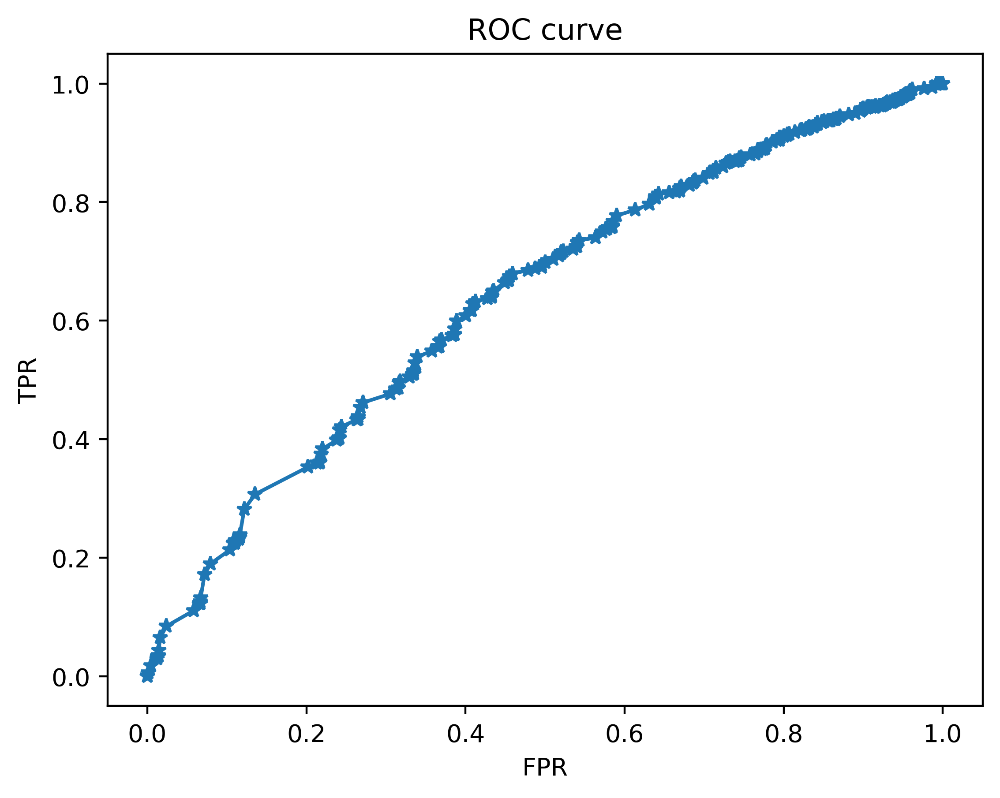

In [215]:
plt.plot(fpr, tpr, '*-')

plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')

In [217]:
from sklearn.metrics import roc_curve

fpr_man, tpr_man, thresholds_man = roc_curve(y_test, pos_prob_preds_manual) # you may replace pos_prob_preds by pos_prob_preds_manual

Text(0.5, 1.0, 'ROC curve manual probs')

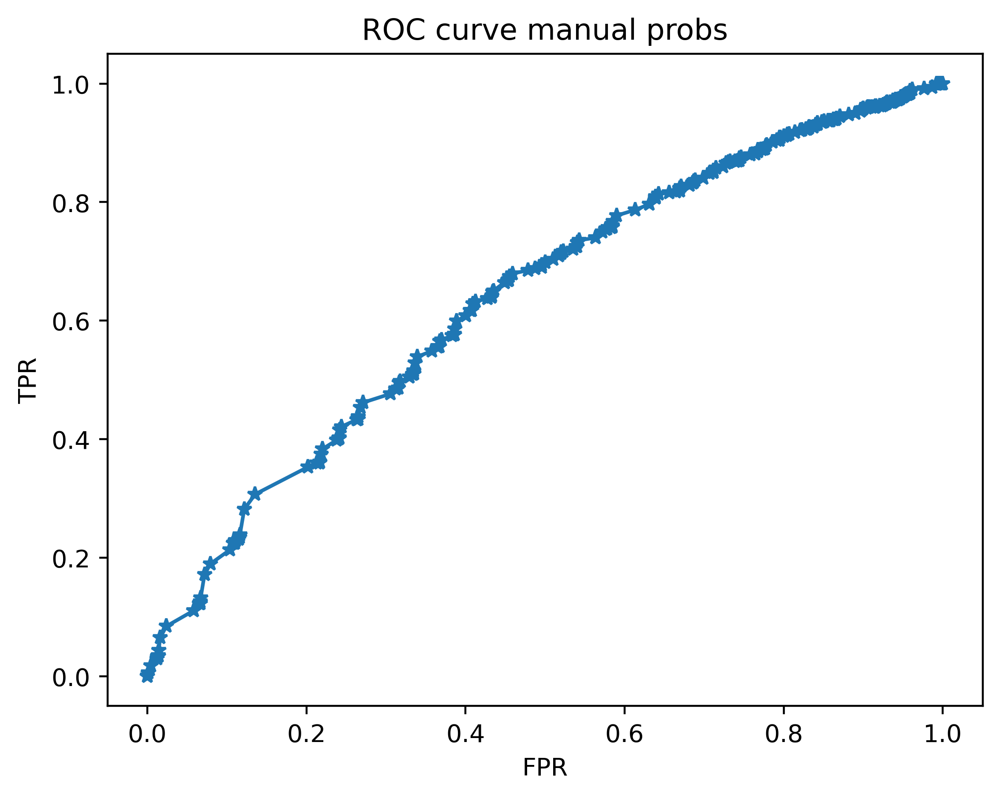

In [218]:
plt.plot(fpr_man, tpr_man, '*-')

plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve manual probs')

In [220]:
from sklearn.metrics import roc_auc_score

roc_auc_score(y_test, pos_prob_preds)

0.6374912949931919

In [221]:
from sklearn.metrics import roc_auc_score

roc_auc_score(y_test, pos_prob_preds_manual)

0.6374912949931919

Some tips from the answer in the book. The following is a faster way of calculating Z than my solution:

In [223]:
ones_and_features = np.hstack([np.ones((N, 1)), X_test]) # Matrix Nx3 where (1, X_1, X_2)
ones_and_features

array([[ 1.0e+00,  2.8e+05, -2.0e+00],
       [ 1.0e+00,  4.2e+05, -1.0e+00],
       [ 1.0e+00,  1.0e+05, -1.0e+00],
       ...,
       [ 1.0e+00,  1.4e+05,  0.0e+00],
       [ 1.0e+00,  2.1e+05,  0.0e+00],
       [ 1.0e+00,  2.9e+05,  2.0e+00]])

In [237]:
intercept_and_coefs = np.concatenate([lr.intercept_.reshape(1,1), lr.coef_], axis=1)
intercept_and_coefs.shape

(1, 3)

In [230]:
Z_p = np.dot(intercept_and_coefs, np.transpose(ones_and_features))
Z_p

array([[-1.89359433, -2.84039149, -0.67628369, ..., -0.94679716,
        -1.42019575, -1.9612227 ]])

In [231]:
np.array_equal(Z, Z_p)

False

In [236]:
(Z-Z_p).sum() # Z y Z_p are (approximately) equal

8.3322237998118e-14